In [1]:
import os
import librosa
import numpy as np
import soundfile as sf
from IPython.display import Audio, display
import matplotlib.pyplot as plt

In [2]:
dir_path = "../piste_pam"

In [3]:
mic_list = ['Basse','Batterie kick','Guitare élec','Piano élec','Batterie up','Saxophone']
list_config = []
for file in os.listdir(dir_path):
    add = True
    for mic in mic_list+['salle A',"Salle B","dico","mixture"]:
        if mic in file:
            add = False
    if add: list_config.append(file)

In [4]:
dict_mixtures = {}
for config in list_config:
    mixtures = []
    for mic in mic_list:
        config_split = config.split('.')
        config_split[0] += ' '+mic
        filename = '.'.join(config_split)
        waveform, sr = librosa.load(dir_path+"/"+filename)
        mixtures.append(waveform)
    multichannel_sound = np.array(mixtures)
    dict_mixtures[config] = multichannel_sound

In [5]:
dict_path = "../piste_pam" 
gpu = 1
n_fft = 1024
n_source = 5
n_basis = 52
n_iter_init = 30
init_SCM = "circular"
g_eps = 5e-2
n_mic = 6
n_bit = 64
algo = "IP"
n_iter = 100

In [6]:
if gpu < 0:
    import numpy as xp
else:
    try:
        import cupy as xp

        print("Use GPU " + str(gpu))
        xp.cuda.Device(gpu).use()
    except ImportError:
        print("Warning: cupy is not installed. 'gpu' argument should be set to -1. Switched to CPU.\n")
        import numpy as xp

Use GPU 1


In [7]:
from src.separation.FastMNMF2 import FastMNMF2
from Base import MultiSTFT

separater_with_dict = FastMNMF2(
    n_source=n_source,
    dict_path=dict_path,
    n_basis=n_basis,
    xp=xp,
    init_SCM=init_SCM,
    n_bit=n_bit,
    algo=algo,
    n_iter_init=n_iter_init,
    g_eps=g_eps,
)

separater_no_dict = FastMNMF2(
    n_source=n_source,
    dict_path='',
    n_basis=n_basis,
    xp=xp,
    init_SCM=init_SCM,
    n_bit=n_bit,
    algo=algo,
    n_iter_init=n_iter_init,
    g_eps=g_eps,
)

In [8]:
for i in range(len(list_config)):
    input_fname = list_config[i]
    wav = dict_mixtures[input_fname].T
    wav /= np.abs(wav).max() * 1.2
    M = min(len(wav), n_mic)
    spec_FTM = MultiSTFT(wav[:, :M], n_fft=n_fft)

    separater_with_dict.file_id = (input_fname.split("/")[-1].split(".")[0]+" with dict")#.replace(" ", "_")
    separater_with_dict.load_spectrogram(spec_FTM, sr)

    separater_with_dict.solve(
        n_iter=n_iter,
        save_dir=os.path.join(dir_path, "results_separation"),
        save_likelihood=True,
        save_param=False,
        save_wav=True,
        interval_save=5,
        init = (i==0)
    )
    break
    separater_no_dict.file_id = (input_fname.split("/")[-1].split(".")[0]+" no dict")#.replace(" ", "_")
    separater_no_dict.load_spectrogram(spec_FTM, sr)

    separater_no_dict.solve(
        n_iter=n_iter,
        save_dir=os.path.join(dir_path, "results_separation"),
        save_likelihood=True,
        save_param=False,
        save_wav=True,
        interval_save=5,
        init = True
    )



Loading dictionnary...
Update FastMNMF2_IP-M=6-S=5-F=513-K=52-init=circular-g=0.05-bit=64-intv_norm=10-ID=sans batterie piano solo with dict  100 times ...


  1%|          | 1/100 [00:06<10:51,  6.58s/it]

In [64]:
wav,sr = sf.read("../piste_pam/results_separation/FastMNMF2_IP-sep-M=6-S=5-F=513-K=52-init=circular-g=0.05-bit=64-intv_norm=10-ID=sans batterie piano solo.wav")
for source in range(5):
    display(Audio(wav[:,source], rate=sr))

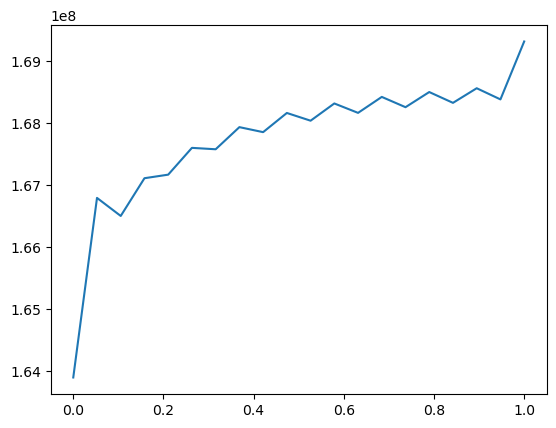

In [74]:
for file in os.listdir("../piste_pam/results_separation"):
    if file.endswith('.txt'):
        with open('../piste_pam/results_separation/'+file) as f:
            file = f.read()
            lines = file.split('\n')
            liste_log_likelihood = []
            for line in lines:
                if 'log_likelihood' in line:
                    liste_log_likelihood.append(float(line.split(' ')[-1]))
        plt.figure()
        plt.plot(np.linspace(0,n_iter,len(liste_log_likelihood)),liste_log_likelihood)
        plt.title(file.split('.')[0])
        plt.show()